TASK 1 — Baseline & Data, Getting Comfortable with CLIP
Fun Demos:
https://www.neuronpedia.org/gemma-scope#steer 
https://douglasduhaime.com/posts/visualizing-latent-spaces.html 
https://distill.pub/2019/activation-atlas/ 
TASK: Set up and play with: https://huggingface.co/docs/transformers/en/model_doc/clip 
Dataset Selection: Curate 100–500 images
Flickr8k: https://www.kaggle.com/datasets/adityajn105/flickr8k/data
CelebA: https://mmlab.ie.cuhk.edu.hk/projects/CelebA.html 
Compute and extract CLIP image embeddings
Run baseline text-query retrieval.
Manually label relevance for top-k results (binary or 1–5)
End of TASK 1: Baseline Precision@k + saved top-k images


## Step 1: Setting Up CLIP

### Model Choice: `clip-vit-base-patch32`
- **ViT-Base**: Vision Transformer, good balance of speed and quality
- **Patch32**: Splits image into 32x32 patches (faster than patch16, slightly less accurate)
- **Embedding size**: 512 dimensions
- For production, you might use `clip-vit-large-patch14` (more accurate but slower)


In [4]:
# Install required packages

%pip install transformers torch pillow matplotlib -q


Note: you may need to restart the kernel to use updated packages.


In [5]:
# Import libraries
import torch
from transformers import CLIPProcessor, CLIPModel
from PIL import Image
import requests
from io import BytesIO

# Check if GPU is available (CLIP runs much faster on GPU)
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

Using device: cpu


In [6]:
# Load CLIP model and processor

model_name = "openai/clip-vit-base-patch32"

# CLIPProcessor: Handles preprocessing for BOTH images and text
# - Images: resize to 224x224, normalize pixel values
# - Text: tokenize and pad to max length
processor = CLIPProcessor.from_pretrained(model_name)

# CLIPModel: The actual neural network
# - Contains image encoder (Vision Transformer) and text encoder (Transformer)
model = CLIPModel.from_pretrained(model_name).to(device)

# Set to evaluation mode (disables dropout, etc.)
model.eval()

print(f" CLIP model loaded: {model_name}")
print(f"   Image embedding size: {model.config.projection_dim}")
print(f"   Text embedding size: {model.config.projection_dim}")


 CLIP model loaded: openai/clip-vit-base-patch32
   Image embedding size: 512
   Text embedding size: 512


### Test CLIP: Understanding How It Works

Workflow:
1. Load an image
2. Encode the image → get image embedding
3. Encode some text queries → get text embeddings
4. Compare embeddings using cosine similarity
5. The text with highest similarity "describes" the image best


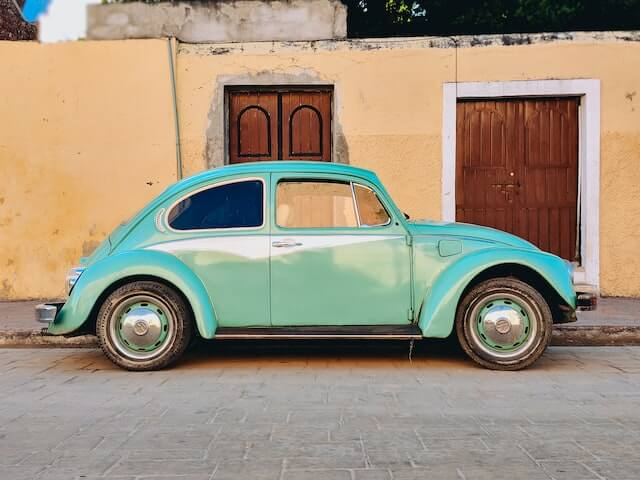

In [7]:
# Load a sample image from the web
url = "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/tasks/car.jpg"

try:
    response = requests.get(url, timeout=10)
    response.raise_for_status()  
    image = Image.open(BytesIO(response.content))
    display(image)
except Exception as e:
    print(f"❌ Error loading image: {e}")


In [8]:
# Define candidate text descriptions
text_queries = [
    "a photo of a dog",
    "a photo of a cat", 
    "a photo of a car",
    "a red sports car",
    "a person walking"
]

# Process inputs through CLIP processor
inputs = processor(
    text=text_queries,          
    images=image,               
    return_tensors="pt",        
    padding=True                 # Pad text to same length
).to(device)

# Get model outputs (no gradient computation needed for inference)
with torch.no_grad():
    outputs = model(**inputs)
    

print(f"Image embedding shape: {outputs.image_embeds.shape}")
print(f"Text embeddings shape: {outputs.text_embeds.shape}")


Image embedding shape: torch.Size([1, 512])
Text embeddings shape: torch.Size([5, 512])


In [9]:
# Get similarity scores (logits_per_image)
# Higher score = better match between image and text
logits = outputs.logits_per_image[0]  

# Convert to probabilities using softmax
probs = logits.softmax(dim=0)

# Display results sorted by probability
print("Which text best describes this image?\n")

# Sort by probability (descending)
sorted_indices = probs.argsort(descending=True)

for idx in sorted_indices:
    text = text_queries[idx]
    prob = probs[idx].item() * 100
    score = logits[idx].item()
    bar = "█" * int(prob / 2)  # Visual bar
    print(f"{prob:5.1f}% | {bar:<50} | {text}")
    
print("-" * 50)
print(f"\n✅ Best match: '{text_queries[sorted_indices[0]]}'")
print(f"   Raw similarity score: {logits[sorted_indices[0]].item():.2f}")


Which text best describes this image?

 99.2% | █████████████████████████████████████████████████  | a photo of a car
  0.7% |                                                    | a red sports car
  0.0% |                                                    | a photo of a cat
  0.0% |                                                    | a person walking
  0.0% |                                                    | a photo of a dog
--------------------------------------------------

✅ Best match: 'a photo of a car'
   Raw similarity score: 27.85


### Helper Functions for Image Retrieval


In [10]:
def get_image_embedding(image, normalize=True):
    """
    Extract CLIP embedding from a PIL Image.
    
    Args:
        image: PIL Image object
        normalize: If True, L2-normalize the embedding (recommended for cosine similarity)
    
    Returns:
        torch.Tensor of shape (512,) - the image embedding
    """
    # Process image
    inputs = processor(images=image, return_tensors="pt").to(device)
    
    # Get embedding
    with torch.no_grad():
        image_features = model.get_image_features(**inputs)
    
    # Normalize if requested (makes cosine similarity = dot product)
    if normalize:
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
    
    return image_features[0]  # Remove batch dimension


def get_text_embedding(text, normalize=True):
    """
    Extract CLIP embedding from a text string.
    
    Args:
        text: String or list of strings
        normalize: If True, L2-normalize the embedding
    
    Returns:
        torch.Tensor of shape (512,) for single text, or (N, 512) for list
    """
    # Handle single string
    if isinstance(text, str):
        text = [text]
        single = True
    else:
        single = False
    
    # Process text
    inputs = processor(text=text, return_tensors="pt", padding=True).to(device)
    
    # Get embedding
    with torch.no_grad():
        text_features = model.get_text_features(**inputs)
    
    # Normalize if requested
    if normalize:
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
    
    return text_features[0] if single else text_features


def cosine_similarity(embedding1, embedding2):
    """
    Compute cosine similarity between two embeddings.
    If embeddings are already normalized, this is just the dot product.
    
    Returns:
        float: similarity score between -1 and 1 (higher = more similar)
    """
    return torch.dot(embedding1, embedding2).item()


print("✅ Helper functions defined!")


✅ Helper functions defined!


In [11]:
# Test the helper functions
print("Testing helper functions with our sample image...\n")

# Get image embedding 
img_emb = get_image_embedding(image)
print(f"Image embedding shape: {img_emb.shape}")
print(f"Image embedding norm: {img_emb.norm().item():.4f} (should be ~1.0 if normalized)\n")

# Test with different text queries (sample image is a car)
test_queries = [
    "a car on the road",
    "a red vehicle",
    "a cute dog",
    "a building in a city"
]

print("Similarity scores:")
for query in test_queries:
    text_emb = get_text_embedding(query)
    similarity = cosine_similarity(img_emb, text_emb)
    bar = "█" * int((similarity + 0.5) * 20)  # Scale for visualization
    print(f"{similarity:.3f} | {bar:<20} | {query}")
    
print("\n CLIP setup complete! Ready for Step 2: Dataset preparation")


Testing helper functions with our sample image...

Image embedding shape: torch.Size([512])
Image embedding norm: 1.0000 (should be ~1.0 if normalized)

Similarity scores:
0.252 | ███████████████      | a car on the road
0.246 | ██████████████       | a red vehicle
0.183 | █████████████        | a cute dog
0.185 | █████████████        | a building in a city

 CLIP setup complete! Ready for Step 2: Dataset preparation


## Step 2: Dataset Setup — Flickr8k

In [15]:
!pip install kagglehub -q

In [40]:
import kagglehub
import shutil
from pathlib import Path

path = kagglehub.dataset_download("adityajn105/flickr8k")

print("Path to dataset files:", path)

dst = Path("./data/flickr8k")
dst.parent.mkdir(parents=True, exist_ok=True)

if dst.exists():
    shutil.rmtree(dst)

shutil.copytree(path, dst)
print("Copied to:", dst)

Path to dataset files: /Users/simretgebreegziabher/.cache/kagglehub/datasets/adityajn105/flickr8k/versions/1
Copied to: data/flickr8k


In [42]:
import os
from pathlib import Path

# Configure paths 
PROJECT_DIR = Path("./data/")  # Current directory
IMAGES_DIR = PROJECT_DIR / "flickr8k/Images"
CAPTIONS_FILE = PROJECT_DIR / "flickr8k/captions.txt"

# Check if dataset exists
if IMAGES_DIR.exists() and CAPTIONS_FILE.exists():
    num_images = len(list(IMAGES_DIR.glob("*.jpg")))
    print(f"✅ Dataset found!")
    print(f"   Images folder: {IMAGES_DIR.absolute()}")
    print(f"   Number of images: {num_images}")
    print(f"   Captions file: {CAPTIONS_FILE.absolute()}")
else:
    print("❌ Dataset not found!")
    print(f"\n   Expected images at: {IMAGES_DIR.absolute()}")
    print(f"   Expected captions at: {CAPTIONS_FILE.absolute()}")
    print("\n📥 Please download from: https://www.kaggle.com/datasets/adityajn105/flickr8k/data")
    print("   Then extract to this project folder.")


✅ Dataset found!
   Images folder: /Users/simretgebreegziabher/Documents/Projects/Proj7/Teaching-VMs-Subjective-Concepts-with-Language/data/flickr8k/Images
   Number of images: 8091
   Captions file: /Users/simretgebreegziabher/Documents/Projects/Proj7/Teaching-VMs-Subjective-Concepts-with-Language/data/flickr8k/captions.txt


In [43]:
# Load and parse captions
# Format: image_name,caption (with header row)

import pandas as pd
from collections import defaultdict

def load_captions(captions_file):
    """
    Load Flickr8k captions into a dictionary.
    
    Returns:
        dict: {image_filename: [caption1, caption2, ..., caption5]}
    """
    captions_dict = defaultdict(list)
    
    # Read the captions file
    with open(captions_file, 'r', encoding='utf-8') as f:
        lines = f.readlines()
    
    # Skip header if present
    start_idx = 1 if 'image' in lines[0].lower() else 0
    
    for line in lines[start_idx:]:
        line = line.strip()
        if not line:
            continue
        
        # Split on first comma (caption might contain commas)
        parts = line.split(',', 1)
        if len(parts) == 2:
            image_name, caption = parts
            captions_dict[image_name].append(caption)
    
    return dict(captions_dict)

# Load captions (run this after downloading the dataset)
if CAPTIONS_FILE.exists():
    captions = load_captions(CAPTIONS_FILE)
    print(f"✅ Loaded captions for {len(captions)} images")
    print(f"   Average captions per image: {sum(len(v) for v in captions.values()) / len(captions):.1f}")
    
    # Show example
    example_image = list(captions.keys())[0]
    print(f"\n📷 Example: {example_image}")
    print("   Captions:")
    for i, cap in enumerate(captions[example_image][:3], 1):
        print(f"   {i}. {cap}")
else:
    print("⏳ Captions file not found. Please download the dataset first.")


✅ Loaded captions for 8091 images
   Average captions per image: 5.0

📷 Example: 1000268201_693b08cb0e.jpg
   Captions:
   1. A child in a pink dress is climbing up a set of stairs in an entry way .
   2. A girl going into a wooden building .
   3. A little girl climbing into a wooden playhouse .


### Select a Diverse Subset of 300 Images

In [44]:
import random
import shutil

# Configuration
SUBSET_SIZE = 300  # Number of images to select
SUBSET_DIR = PROJECT_DIR / "images_subset"  # Where to save selected images
SEED = 42  # For reproducibility

def select_diverse_subset(captions_dict, n=300, seed=42):
    """
    Select a diverse subset of images.
    
    Strategy: Random sampling (ensures diversity across the dataset)
    """
    random.seed(seed)
    all_images = list(captions_dict.keys())
    
    # Simple random sampling - works well for diverse datasets
    selected = random.sample(all_images, min(n, len(all_images)))
    
    return selected

def copy_subset_images(selected_images, src_dir, dst_dir):
    """Copy selected images to a new directory."""
    dst_dir = Path(dst_dir)
    dst_dir.mkdir(exist_ok=True)
    
    copied = 0
    for img_name in selected_images:
        src_path = src_dir / img_name
        dst_path = dst_dir / img_name
        
        if src_path.exists():
            shutil.copy2(src_path, dst_path)
            copied += 1
    
    return copied

# Select and copy images (run after downloading dataset)
if IMAGES_DIR.exists() and 'captions' in dir():
    # Select diverse subset
    selected_images = select_diverse_subset(captions, n=SUBSET_SIZE, seed=SEED)
    print(f"📋 Selected {len(selected_images)} diverse images")
    
    # Copy to subset folder
    copied = copy_subset_images(selected_images, IMAGES_DIR, SUBSET_DIR)
    print(f"📁 Copied {copied} images to: {SUBSET_DIR.absolute()}")
    
    # Create subset captions dictionary
    subset_captions = {img: captions[img] for img in selected_images if img in captions}
    print(f"📝 Subset has captions for {len(subset_captions)} images")
    
    # Preview some categories based on caption keywords
    print("\n🏷️ Sample concepts in your subset:")
    keywords = ['dog', 'child', 'man', 'woman', 'water', 'ball', 'bike', 'snow']
    for kw in keywords:
        count = sum(1 for img, caps in subset_captions.items() 
                   if any(kw in c.lower() for c in caps))
        if count > 0:
            print(f"   - '{kw}': {count} images")
else:
    print("⏳ Please download the dataset and run previous cells first.")


📋 Selected 300 diverse images
📁 Copied 300 images to: /Users/simretgebreegziabher/Documents/Projects/Proj7/Teaching-VMs-Subjective-Concepts-with-Language/data/images_subset
📝 Subset has captions for 300 images

🏷️ Sample concepts in your subset:
   - 'dog': 69 images
   - 'child': 44 images
   - 'man': 138 images
   - 'woman': 44 images
   - 'water': 48 images
   - 'ball': 36 images
   - 'bike': 18 images
   - 'snow': 22 images


📷 Sample images from your subset:



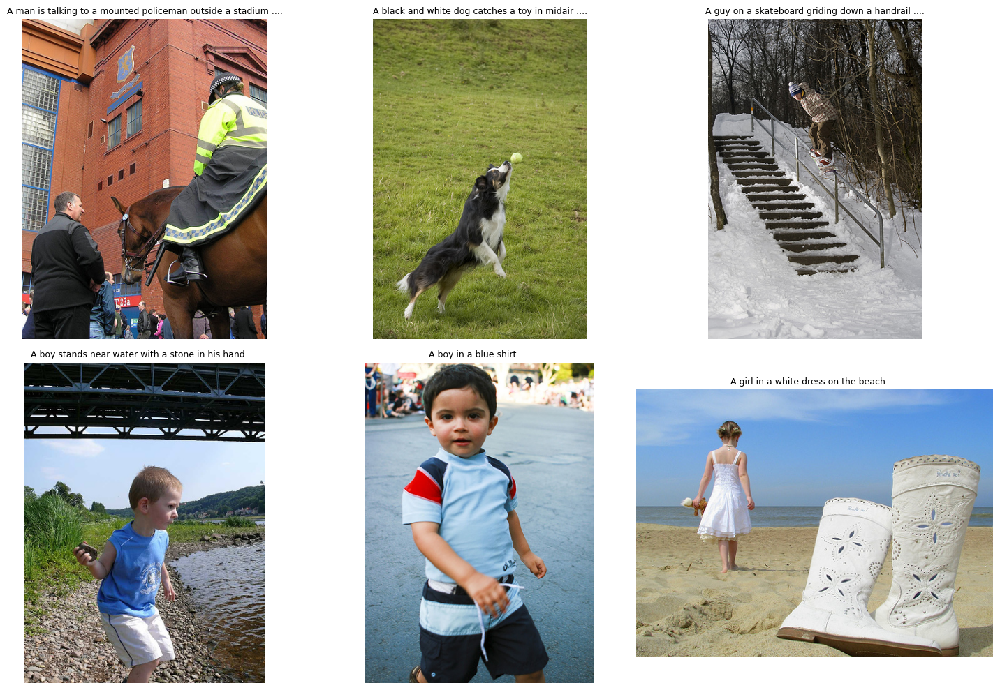

In [45]:
# Visualize sample images from the subset
import matplotlib.pyplot as plt

def show_sample_images(image_dir, captions_dict, n=6):
    """Display sample images with their captions."""
    image_dir = Path(image_dir)
    images = list(image_dir.glob("*.jpg"))[:n]
    
    if not images:
        print("No images found!")
        return
    
    # Create grid
    cols = 3
    rows = (len(images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(15, 5*rows))
    axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
    
    for i, img_path in enumerate(images):
        img = Image.open(img_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        
        # Get first caption
        img_name = img_path.name
        if img_name in captions_dict:
            caption = captions_dict[img_name][0][:60] + "..."
        else:
            caption = "No caption"
        axes[i].set_title(caption, fontsize=9, wrap=True)
    
    # Hide empty subplots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

# Show samples (run after creating subset)
if SUBSET_DIR.exists() and 'subset_captions' in dir():
    print("📷 Sample images from your subset:\n")
    show_sample_images(SUBSET_DIR, subset_captions, n=6)
else:
    print("⏳ Please run previous cells to create the subset first.")


In [46]:
# Save subset metadata for later use
import json

METADATA_FILE = PROJECT_DIR / "subset_metadata.json"

def save_subset_metadata(selected_images, captions_dict, output_file):
    """Save subset info to JSON for reproducibility."""
    metadata = {
        "num_images": len(selected_images),
        "seed": SEED,
        "images": {
            img: captions_dict.get(img, [])
            for img in selected_images
        }
    }
    
    with open(output_file, 'w', encoding='utf-8') as f:
        json.dump(metadata, f, indent=2)
    
    return output_file

# Save metadata
if 'selected_images' in dir() and 'subset_captions' in dir():
    save_subset_metadata(selected_images, subset_captions, METADATA_FILE)
    print(f"✅ Saved subset metadata to: {METADATA_FILE.absolute()}")
    print(f"   This file contains image names and their captions.")
    print(f"   You can reload this to reproduce exact experiments.")
else:
    print("⏳ Please run previous cells first.")


✅ Saved subset metadata to: /Users/simretgebreegziabher/Documents/Projects/Proj7/Teaching-VMs-Subjective-Concepts-with-Language/data/subset_metadata.json
   This file contains image names and their captions.
   You can reload this to reproduce exact experiments.


## Step 3: Compute & Store CLIP Image Embeddings

In [47]:
import numpy as np
from tqdm import tqdm
import time

def compute_all_embeddings(image_dir, batch_size=16):
    """
    Compute CLIP embeddings for all images in a directory.
    
    Args:
        image_dir: Path to directory containing images
        batch_size: Number of images to process at once (higher = faster but more memory)
    
    Returns:
        image_names: List of image filenames
        embeddings: numpy array of shape (num_images, 512)
    """
    image_dir = Path(image_dir)
    image_paths = sorted(list(image_dir.glob("*.jpg")))
    
    print(f"🖼️ Found {len(image_paths)} images to embed")
    print(f"   Using device: {device}")
    print(f"   Batch size: {batch_size}")
    
    image_names = []
    all_embeddings = []
    
    start_time = time.time()
    
    # Process in batches for efficiency
    for i in tqdm(range(0, len(image_paths), batch_size), desc="Computing embeddings"):
        batch_paths = image_paths[i:i + batch_size]
        batch_images = []
        batch_names = []
        
        # Load images in batch
        for img_path in batch_paths:
            try:
                img = Image.open(img_path).convert("RGB")
                batch_images.append(img)
                batch_names.append(img_path.name)
            except Exception as e:
                print(f"   ⚠️ Skipping {img_path.name}: {e}")
        
        if not batch_images:
            continue
        
        # Process batch through CLIP
        inputs = processor(images=batch_images, return_tensors="pt", padding=True).to(device)
        
        with torch.no_grad():
            image_features = model.get_image_features(**inputs)
            # Normalize embeddings
            image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        
        # Store results
        all_embeddings.append(image_features.cpu().numpy())
        image_names.extend(batch_names)
    
    # Concatenate all batches
    embeddings = np.vstack(all_embeddings)
    
    elapsed = time.time() - start_time
    print(f"\n✅ Computed {len(image_names)} embeddings in {elapsed:.1f} seconds")
    print(f"   Embeddings shape: {embeddings.shape}")
    print(f"   Speed: {len(image_names)/elapsed:.1f} images/second")
    
    return image_names, embeddings

# Compute embeddings for subset
if SUBSET_DIR.exists():
    image_names, image_embeddings = compute_all_embeddings(SUBSET_DIR, batch_size=16)
else:
    print("⏳ Please run Step 2 first to create the image subset.")


🖼️ Found 300 images to embed
   Using device: cpu
   Batch size: 16


Computing embeddings: 100%|██████████| 19/19 [00:07<00:00,  2.39it/s]


✅ Computed 300 embeddings in 8.0 seconds
   Embeddings shape: (300, 512)
   Speed: 37.7 images/second


In [48]:
# Save embeddings to disk (so you don't need to recompute)
EMBEDDINGS_FILE = PROJECT_DIR / "image_embeddings.npz"

def save_embeddings(image_names, embeddings, output_file):
    """Save embeddings and image names to a compressed numpy file."""
    np.savez_compressed(
        output_file,
        image_names=np.array(image_names),
        embeddings=embeddings
    )
    print(f"✅ Saved embeddings to: {output_file}")
    print(f"   File size: {output_file.stat().st_size / 1024 / 1024:.2f} MB")

def load_embeddings(input_file):
    """Load embeddings from file."""
    data = np.load(input_file, allow_pickle=True)
    return list(data['image_names']), data['embeddings']

# Save embeddings
if 'image_embeddings' in dir():
    save_embeddings(image_names, image_embeddings, EMBEDDINGS_FILE)
    
    # Verify we can reload them
    loaded_names, loaded_embs = load_embeddings(EMBEDDINGS_FILE)
    print(f"   Verified: loaded {len(loaded_names)} embeddings, shape {loaded_embs.shape}")
else:
    print("⏳ Please run the embedding computation cell first.")


✅ Saved embeddings to: data/image_embeddings.npz
   File size: 0.55 MB
   Verified: loaded 300 embeddings, shape (300, 512)


## Step 4: Baseline Text-Query Retrieval
1. **Input**: Text query (e.g., "a dog playing with a ball")
2. **Process**: Encode query → compare to all image embeddings
3. **Output**: Top-k most similar images


In [49]:
def retrieve_images(query, image_names, image_embeddings, top_k=5):
    """
    Retrieve top-k images most similar to a text query.
    
    Args:
        query: Text string (e.g., "a dog running on the beach")
        image_names: List of image filenames
        image_embeddings: numpy array of shape (num_images, 512)
        top_k: Number of results to return
    
    Returns:
        results: List of (image_name, similarity_score) tuples, sorted by score
    """
    # Encode the text query
    text_emb = get_text_embedding(query)  # Returns normalized torch tensor
    text_emb_np = text_emb.cpu().numpy()
    
    # Compute similarities (dot product since embeddings are normalized)
    similarities = image_embeddings @ text_emb_np
    
    # Get top-k indices
    top_indices = np.argsort(similarities)[::-1][:top_k]
    
    # Build results
    results = [(image_names[i], similarities[i]) for i in top_indices]
    
    return results


def display_retrieval_results(query, results, image_dir, captions_dict=None):
    """Display retrieval results with images and scores."""
    print(f"🔍 Query: \"{query}\"\n")
    print("=" * 60)
    
    n = len(results)
    cols = min(5, n)
    rows = (n + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(4*cols, 4*rows))
    if n == 1:
        axes = [axes]
    else:
        axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
    
    for i, (img_name, score) in enumerate(results):
        img_path = Path(image_dir) / img_name
        if img_path.exists():
            img = Image.open(img_path)
            axes[i].imshow(img)
        
        # Title with rank and score
        title = f"#{i+1} | Score: {score:.3f}"
        if captions_dict and img_name in captions_dict:
            caption = captions_dict[img_name][0][:40] + "..."
            title += f"\n{caption}"
        
        axes[i].set_title(title, fontsize=9)
        axes[i].axis('off')
    
    # Hide unused subplots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

print("✅ Retrieval functions defined!")


✅ Retrieval functions defined!


🔍 Query: "a dog running"



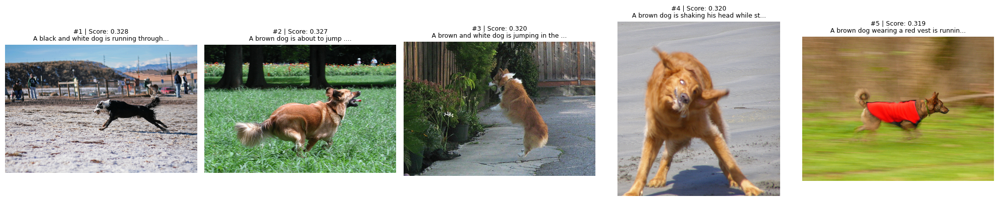



🔍 Query: "children playing"



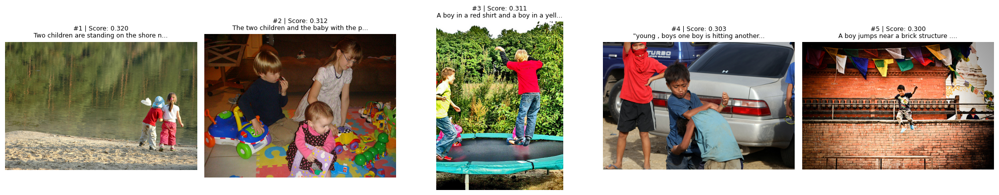



🔍 Query: "a person on a bicycle"



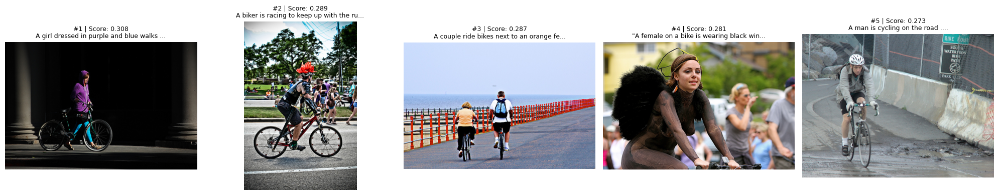

In [50]:
# Test retrieval with sample queries
# Try different queries to see how CLIP performs!

test_queries = [
    "a dog running",
    "children playing",
    "a person on a bicycle",
]

# Run retrieval for each query
for query in test_queries:
    results = retrieve_images(query, image_names, image_embeddings, top_k=5)
    display_retrieval_results(query, results, SUBSET_DIR, subset_captions)
    print("\n")


## Step 5: Manual Labeling & Precision@k

1. Look at the top-k retrieved images
2. Label each as **relevant (1)** or **not relevant (0)**
3. Calculate **Precision@k** = (# relevant in top-k) / k


In [51]:
# Storage for relevance labels
# Structure: {query: {image_name: relevance_score}}
relevance_labels = {}

def label_results_interactive(query, results, image_dir, captions_dict=None):
    """
    Interactive labeling: Display results and collect relevance labels.
    
    For now, we'll use a simple approach - you look at the displayed images
    and then enter labels in the next cell.
    """
    print(f"📝 LABELING TASK for query: \"{query}\"")
    print("=" * 60)
    print("Look at the images above and rate each:")
    print("  1 = Relevant (matches the query)")
    print("  0 = Not relevant (doesn't match)")
    print()
    
    # Show results for reference
    for i, (img_name, score) in enumerate(results):
        caption = ""
        if captions_dict and img_name in captions_dict:
            caption = f" | Caption: {captions_dict[img_name][0][:50]}..."
        print(f"  Image #{i+1}: {img_name} (score: {score:.3f}){caption}")
    
    print()
    print("➡️ Enter labels in the next cell using the format:")
    print(f'   labels = [1, 0, 1, 1, 0]  # for 5 results')
    
    return results


def calculate_precision_at_k(labels):
    """Calculate Precision@k from a list of binary relevance labels."""
    if not labels:
        return 0.0
    return sum(labels) / len(labels)


def save_evaluation_results(query, results, labels, output_dict):
    """Save labeled results to dictionary."""
    output_dict[query] = {
        "results": [(img, float(score)) for img, score in results],
        "labels": labels,
        "precision_at_k": calculate_precision_at_k(labels),
        "k": len(labels)
    }
    return output_dict[query]

print("✅ Labeling functions defined!")


✅ Labeling functions defined!


🔍 Query: "a dog running"



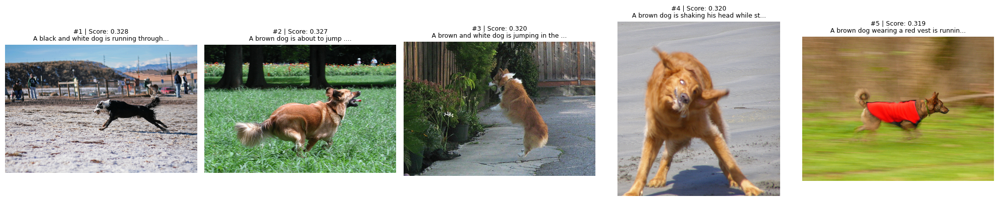

📝 LABELING TASK for query: "a dog running"
Look at the images above and rate each:
  1 = Relevant (matches the query)
  0 = Not relevant (doesn't match)

  Image #1: 2256218522_53b92bcbb2.jpg (score: 0.328) | Caption: A black and white dog is running through the sand ...
  Image #2: 2180480870_dcaf5ac0df.jpg (score: 0.327) | Caption: A brown dog is about to jump ....
  Image #3: 3415165462_e1cb536d08.jpg (score: 0.320) | Caption: A brown and white dog is jumping in the air with a...
  Image #4: 489372715_ce52da796a.jpg (score: 0.320) | Caption: A brown dog is shaking his head while standing on ...
  Image #5: 2110898123_07729c1461.jpg (score: 0.319) | Caption: A brown dog wearing a red vest is running in the g...

➡️ Enter labels in the next cell using the format:
   labels = [1, 0, 1, 1, 0]  # for 5 results


[('2256218522_53b92bcbb2.jpg', np.float32(0.32776272)),
 ('2180480870_dcaf5ac0df.jpg', np.float32(0.32722476)),
 ('3415165462_e1cb536d08.jpg', np.float32(0.32013673)),
 ('489372715_ce52da796a.jpg', np.float32(0.32010803)),
 ('2110898123_07729c1461.jpg', np.float32(0.31905416))]

In [52]:
# === LABELING WORKFLOW ===
# Step 1: Choose a query and retrieve results
query = "a dog running"
k = 5

results = retrieve_images(query, image_names, image_embeddings, top_k=k)
display_retrieval_results(query, results, SUBSET_DIR, subset_captions)
label_results_interactive(query, results, SUBSET_DIR, subset_captions)


In [53]:
# === Step 2: Enter your labels here ===

# EDIT THIS LINE with your labels (one per image, in order):
labels = [1, 1, 0, 0, 1] 

# Save and calculate precision
eval_result = save_evaluation_results(query, results, labels, relevance_labels)

print(f"📊 Results for query: \"{query}\"")
print(f"   Labels: {labels}")
print(f"   Precision@{k}: {eval_result['precision_at_k']:.1%}")
print(f"   ({sum(labels)} relevant out of {k} results)")


📊 Results for query: "a dog running"
   Labels: [1, 1, 0, 0, 1]
   Precision@5: 60.0%
   (3 relevant out of 5 results)


📷 VIEW IMAGES FOR EACH QUERY - Update labels above based on what you see!

🔍 Query: "a dog running"
   Current labels: [1, 1, 0, 0, 1]



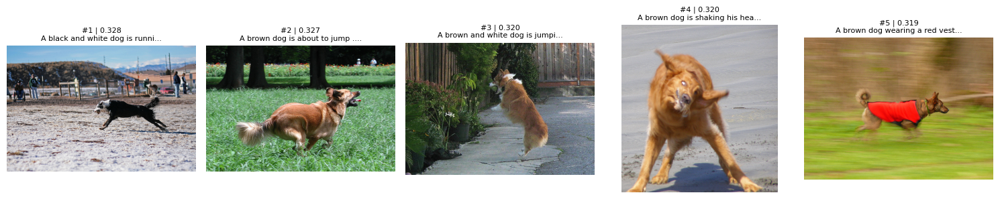

----------------------------------------------------------------------

🔍 Query: "children playing"
   Current labels: [1, 1, 1, 0, 0]



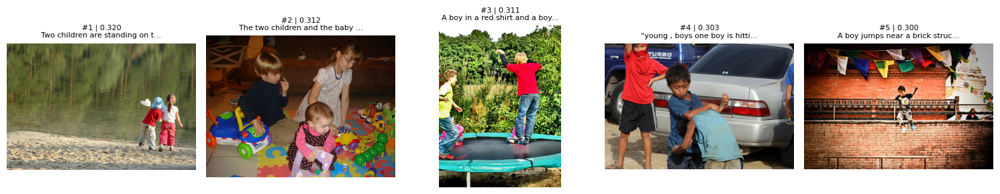

----------------------------------------------------------------------

🔍 Query: "a person on a bicycle"
   Current labels: [1, 1, 1, 1, 1]



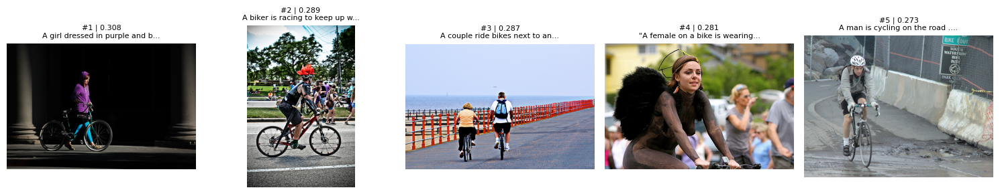

----------------------------------------------------------------------


📊 BASELINE EVALUATION RESULTS (Flickr8k)
Query: "a dog running"
  Labels: [1, 1, 0, 0, 1]
  Precision@5: 60.0% (3/5 relevant)

Query: "children playing"
  Labels: [1, 1, 1, 0, 0]
  Precision@5: 60.0% (3/5 relevant)

Query: "a person on a bicycle"
  Labels: [1, 1, 1, 1, 1]
  Precision@5: 100.0% (5/5 relevant)

📈 FLICKR8K AVERAGE PRECISION@5: 73.3%
   (across 3 queries)

Update the labels in evaluation_queries above, then re-run this cell!


In [54]:
# === EVALUATE MULTIPLE QUERIES ===
# After labeling several queries, run this to see overall performance


evaluation_queries = {
    "a dog running": {"labels": [1, 1, 0, 0, 1]},     
    "children playing": {"labels": [1, 1, 1, 0, 0]},  
    "a person on a bicycle": {"labels": [1, 1, 1, 1, 1]},  
}

K = 5  # Number of results per query

# Display images for each query so you can label them
print("📷 VIEW IMAGES FOR EACH QUERY - Update labels above based on what you see!\n")

for q in evaluation_queries.keys():
    results = retrieve_images(q, image_names, image_embeddings, top_k=K)
    
    print(f"🔍 Query: \"{q}\"")
    print(f"   Current labels: {evaluation_queries[q]['labels']}")
    print()
    
    # Display images in a row
    fig, axes = plt.subplots(1, K, figsize=(15, 3))
    
    for i, (img_name, score) in enumerate(results):
        img_path = SUBSET_DIR / img_name
        if img_path.exists():
            img = Image.open(img_path)
            axes[i].imshow(img)
        
        # Show caption if available
        caption = ""
        if img_name in subset_captions:
            caption = subset_captions[img_name][0][:30] + "..."
        
        axes[i].set_title(f"#{i+1} | {score:.3f}\n{caption}", fontsize=8)
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.show()
    print("-" * 70)
    print()

# Now compute precision based on your labels
print("\n📊 BASELINE EVALUATION RESULTS (Flickr8k)")
print("=" * 60)

all_precisions = []
for q, data in evaluation_queries.items():
    results = retrieve_images(q, image_names, image_embeddings, top_k=len(data["labels"]))
    precision = calculate_precision_at_k(data["labels"])
    all_precisions.append(precision)
    
    save_evaluation_results(q, results, data["labels"], relevance_labels)
    print(f"Query: \"{q}\"")
    print(f"  Labels: {data['labels']}")
    print(f"  Precision@{len(data['labels'])}: {precision:.1%} ({sum(data['labels'])}/{len(data['labels'])} relevant)")
    print()

# Overall metrics
avg_precision = np.mean(all_precisions)
print("=" * 60)
print(f"📈 FLICKR8K AVERAGE PRECISION@{K}: {avg_precision:.1%}")
print(f"   (across {len(evaluation_queries)} queries)")
print()
print("Update the labels in evaluation_queries above, then re-run this cell!")


In [55]:
# Save all evaluation results for later comparison
RESULTS_FILE = PROJECT_DIR / "baseline_results.json"

baseline_summary = {
    "model": model_name,
    "num_images": len(image_names),
    "queries": relevance_labels,
    "average_precision": float(avg_precision) if 'avg_precision' in dir() else None
}

with open(RESULTS_FILE, 'w') as f:
    json.dump(baseline_summary, f, indent=2)

print(f"✅ Saved baseline results to: {RESULTS_FILE}")
print(f"\n📁 Files created in this notebook:")
print(f"   - images_subset/        ({len(image_names)} images)")
print(f"   - subset_metadata.json  (image list + captions)")
print(f"   - image_embeddings.npz  (precomputed CLIP embeddings)")
print(f"   - baseline_results.json (evaluation results)")


✅ Saved baseline results to: data/baseline_results.json

📁 Files created in this notebook:
   - images_subset/        (300 images)
   - subset_metadata.json  (image list + captions)
   - image_embeddings.npz  (precomputed CLIP embeddings)
   - baseline_results.json (evaluation results)


## Step 6: Load CelebA Dataset & Extract CLIP Embeddings

In [58]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("jessicali9530/celeba-dataset")

print("Path to dataset files:", path)

dst = Path("./data/img-align-celeba")
dst.parent.mkdir(parents=True, exist_ok=True)

if dst.exists():
    shutil.rmtree(dst)

shutil.copytree(path, dst)
print("Copied to:", dst)


100%|██████████| 1.33G/1.33G [00:21<00:00, 66.8MB/s]

Extracting files...


Path to dataset files: /Users/simretgebreegziabher/.cache/kagglehub/datasets/jessicali9530/celeba-dataset/versions/2
Copied to: data/img-align-celeba


In [69]:
CELEBA_IMAGES_DIR = PROJECT_DIR / "img-align-celeba" / "img_align_celeba"/ "img_align_celeba"

print("Checking CelebA dataset...", len(list(CELEBA_IMAGES_DIR.glob("*.jpg"))))

print("hellp")

Checking CelebA dataset... 202599
hellp


In [70]:
# Configure CelebA paths 
CELEBA_IMAGES_DIR = PROJECT_DIR / "img-align-celeba" / "img_align_celeba"/ "img_align_celeba"
CELEBA_ATTR_FILE = PROJECT_DIR / "img-align-celeba" / "list_attr_celeba.csv"


# Check if dataset exists
if CELEBA_IMAGES_DIR.exists():
    celeba_images = list(CELEBA_IMAGES_DIR.glob("*.jpg"))
    print(f"✅ CelebA dataset found!")
    print(f"   Images folder: {CELEBA_IMAGES_DIR}")
    print(f"   Number of images: {len(celeba_images)}")
    if CELEBA_ATTR_FILE.exists():
        print(f"   Attributes file: {CELEBA_ATTR_FILE}")
    else:
        print(f"   ⚠️ Attributes file not found (optional for embeddings)")
else:
    print("❌ CelebA dataset not found!")
    print(f"\n   Expected at: {CELEBA_IMAGES_DIR}")


✅ CelebA dataset found!
   Images folder: data/img-align-celeba/img_align_celeba/img_align_celeba
   Number of images: 202599
   Attributes file: data/img-align-celeba/list_attr_celeba.csv


In [71]:
# Load CelebA attributes (optional - useful for validation later)
def load_celeba_attributes(attr_file):
    """
    Load CelebA attribute labels.
    
    Returns:
        attributes_df: DataFrame with image_id as index and 40 attribute columns
        attribute_names: List of attribute names
    """
    attr_file = Path(attr_file)
    
    if attr_file.suffix == '.csv':
        # Kaggle format (CSV)
        df = pd.read_csv(attr_file)
        df = df.set_index('image_id')
    else:
        # Official format (space-separated with header rows)
        df = pd.read_csv(attr_file, sep='\s+', skiprows=1)
        df.index.name = 'image_id'
    
    # Convert -1/1 to 0/1 if needed
    df = df.replace(-1, 0)
    
    attribute_names = list(df.columns)
    return df, attribute_names

# Load attributes
if CELEBA_ATTR_FILE.exists():
    celeba_attributes, attribute_names = load_celeba_attributes(CELEBA_ATTR_FILE)
    print(f"✅ Loaded attributes for {len(celeba_attributes)} images")
    print(f"\n📋 40 CelebA Attributes:")
    
    # Display in columns
    for i in range(0, len(attribute_names), 4):
        row = attribute_names[i:i+4]
        print("   " + "  |  ".join(f"{name:20}" for name in row))
else:
    print("⚠️ Attributes file not found. Proceeding without attributes.")
    celeba_attributes = None
    attribute_names = None


✅ Loaded attributes for 202599 images

📋 40 CelebA Attributes:
   5_o_Clock_Shadow      |  Arched_Eyebrows       |  Attractive            |  Bags_Under_Eyes     
   Bald                  |  Bangs                 |  Big_Lips              |  Big_Nose            
   Black_Hair            |  Blond_Hair            |  Blurry                |  Brown_Hair          
   Bushy_Eyebrows        |  Chubby                |  Double_Chin           |  Eyeglasses          
   Goatee                |  Gray_Hair             |  Heavy_Makeup          |  High_Cheekbones     
   Male                  |  Mouth_Slightly_Open   |  Mustache              |  Narrow_Eyes         
   No_Beard              |  Oval_Face             |  Pale_Skin             |  Pointy_Nose         
   Receding_Hairline     |  Rosy_Cheeks           |  Sideburns             |  Smiling             
   Straight_Hair         |  Wavy_Hair             |  Wearing_Earrings      |  Wearing_Hat         
   Wearing_Lipstick      |  Wearing_Necklace  

In [72]:
# Select a subset of CelebA image

CELEBA_SUBSET_SIZE = 500  
CELEBA_SUBSET_DIR = PROJECT_DIR / "celeba_subset"
CELEBA_SEED = 42

def select_celeba_subset(images_dir, n=500, seed=42):
    """Select a random subset of CelebA images."""
    random.seed(seed)
    
    all_images = sorted(list(Path(images_dir).glob("*.jpg")))
    print(f"Found {len(all_images)} total CelebA images")
    
    # Random sample
    selected = random.sample(all_images, min(n, len(all_images)))
    
    return selected

def copy_celeba_subset(selected_paths, dst_dir):
    """Copy selected CelebA images to subset folder."""
    dst_dir = Path(dst_dir)
    dst_dir.mkdir(exist_ok=True)
    
    copied = 0
    for src_path in selected_paths:
        dst_path = dst_dir / src_path.name
        if not dst_path.exists():
            shutil.copy2(src_path, dst_path)
        copied += 1
    
    return copied

# Create CelebA subset
if CELEBA_IMAGES_DIR.exists():
    print(f"📋 Selecting {CELEBA_SUBSET_SIZE} random CelebA images...")
    celeba_selected = select_celeba_subset(CELEBA_IMAGES_DIR, n=CELEBA_SUBSET_SIZE, seed=CELEBA_SEED)
    
    print(f"📁 Copying to {CELEBA_SUBSET_DIR}...")
    copied = copy_celeba_subset(celeba_selected, CELEBA_SUBSET_DIR)
    print(f"✅ Copied {copied} images to subset folder")
    
    # Get image names for the subset
    celeba_subset_names = [p.name for p in celeba_selected]
    
    # Get attributes for subset (if available)
    if celeba_attributes is not None:
        celeba_subset_attrs = celeba_attributes.loc[celeba_attributes.index.isin(celeba_subset_names)]
        print(f"📊 Attributes available for {len(celeba_subset_attrs)} subset images")
    else:
        celeba_subset_attrs = None
else:
    print("⏳ Please download CelebA first.")


📋 Selecting 500 random CelebA images...
Found 202599 total CelebA images
📁 Copying to data/celeba_subset...
✅ Copied 500 images to subset folder
📊 Attributes available for 500 subset images


📷 Sample CelebA faces from your subset:



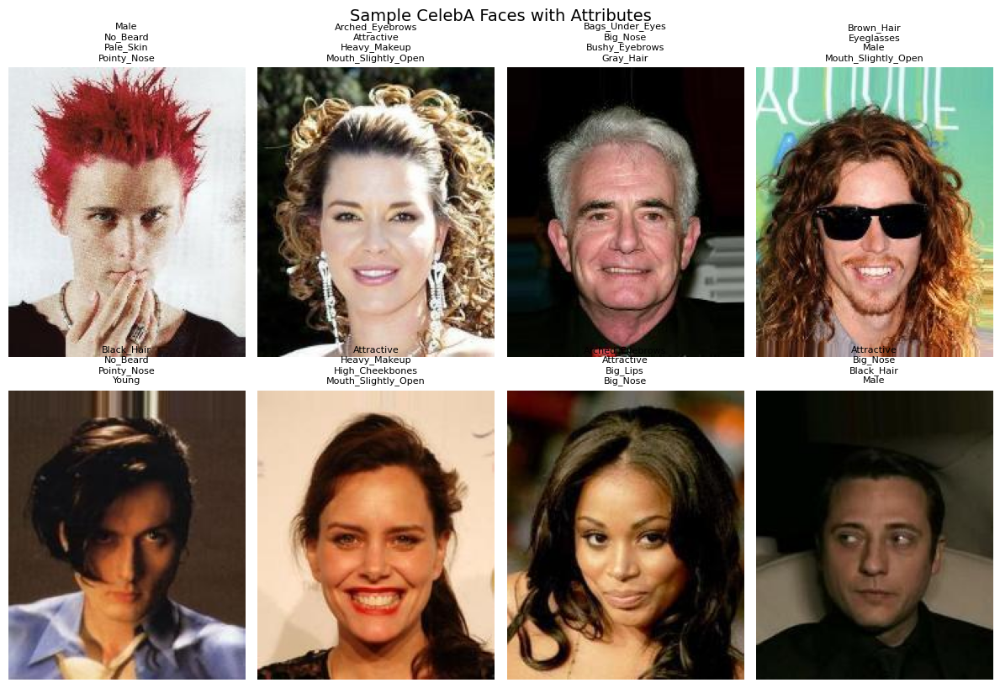

In [73]:
# Visualize sample CelebA faces with their attributes
def show_celeba_samples(image_dir, attributes_df=None, n=8):
    """Display sample CelebA faces with attributes."""
    image_dir = Path(image_dir)
    images = sorted(list(image_dir.glob("*.jpg")))[:n]
    
    if not images:
        print("No images found!")
        return
    
    cols = 4
    rows = (len(images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=(12, 4*rows))
    axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
    
    for i, img_path in enumerate(images):
        img = Image.open(img_path)
        axes[i].imshow(img)
        axes[i].axis('off')
        
        # Get attributes if available
        img_name = img_path.name
        if attributes_df is not None and img_name in attributes_df.index:
            # Get positive attributes (value = 1)
            attrs = attributes_df.loc[img_name]
            positive_attrs = [name for name, val in attrs.items() if val == 1][:4]
            title = "\n".join(positive_attrs) if positive_attrs else "No attrs"
        else:
            title = img_name
        
        axes[i].set_title(title, fontsize=8)
    
    # Hide unused
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.suptitle("Sample CelebA Faces with Attributes", y=1.02, fontsize=14)
    plt.show()

# Show samples
if CELEBA_SUBSET_DIR.exists():
    print("📷 Sample CelebA faces from your subset:\n")
    show_celeba_samples(CELEBA_SUBSET_DIR, celeba_subset_attrs, n=8)
else:
    print("⏳ Please run the subset creation cell first.")


## Step 7: Extract CLIP Embeddings for CelebA Faces

In [74]:
# Compute CLIP embeddings for CelebA faces

CELEBA_EMBEDDINGS_FILE = PROJECT_DIR / "celeba_embeddings.npz"

# Compute embeddings
if CELEBA_SUBSET_DIR.exists():
    print("🧠 Computing CLIP embeddings for CelebA faces...")
    print("   This may take a few minutes on CPU...\n")
    
    celeba_image_names, celeba_embeddings = compute_all_embeddings(
        CELEBA_SUBSET_DIR, 
        batch_size=16
    )
    
    print(f"\n📊 CelebA Embedding Statistics:")
    print(f"   Number of images: {len(celeba_image_names)}")
    print(f"   Embedding shape: {celeba_embeddings.shape}")
    print(f"   Embedding dtype: {celeba_embeddings.dtype}")
else:
    print("⏳ Please create the CelebA subset first.")


🧠 Computing CLIP embeddings for CelebA faces...
   This may take a few minutes on CPU...

🖼️ Found 500 images to embed
   Using device: cpu
   Batch size: 16


Computing embeddings:   0%|          | 0/32 [00:00<?, ?it/s]

Computing embeddings: 100%|██████████| 32/32 [00:13<00:00,  2.43it/s]


✅ Computed 500 embeddings in 13.2 seconds
   Embeddings shape: (500, 512)
   Speed: 38.0 images/second

📊 CelebA Embedding Statistics:
   Number of images: 500
   Embedding shape: (500, 512)
   Embedding dtype: float32


In [75]:
# Save CelebA embeddings
if 'celeba_embeddings' in dir():
    save_embeddings(celeba_image_names, celeba_embeddings, CELEBA_EMBEDDINGS_FILE)
    
    # Verify
    loaded_names, loaded_embs = load_embeddings(CELEBA_EMBEDDINGS_FILE)
    print(f"   Verified: loaded {len(loaded_names)} embeddings")
else:
    print("⏳ Please compute embeddings first.")


✅ Saved embeddings to: data/celeba_embeddings.npz
   File size: 0.91 MB
   Verified: loaded 500 embeddings


Testing CLIP retrieval on CelebA faces:

🔍 Query: "a person wearing glasses"



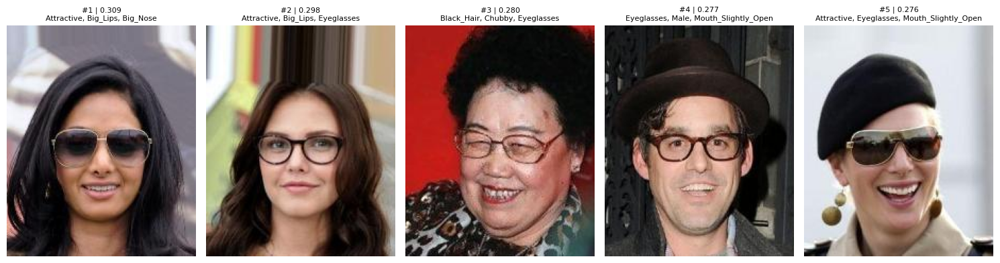


🔍 Query: "a smiling woman"



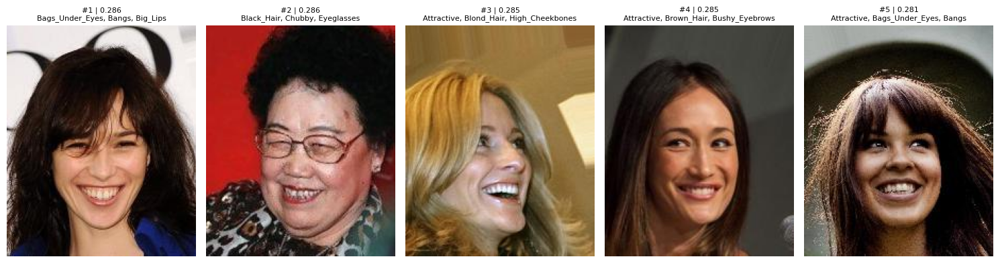


🔍 Query: "a man with a beard"



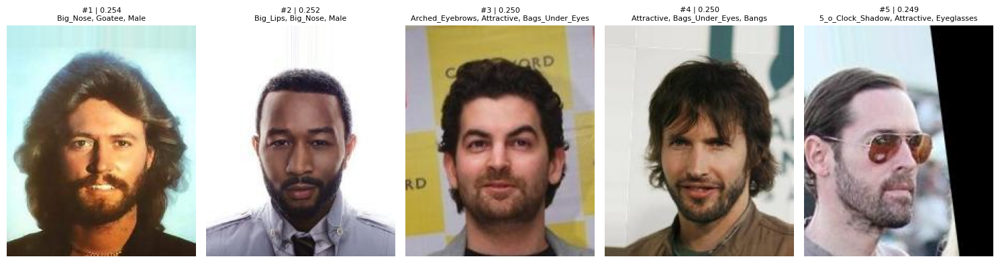


🔍 Query: "a person with blonde hair"



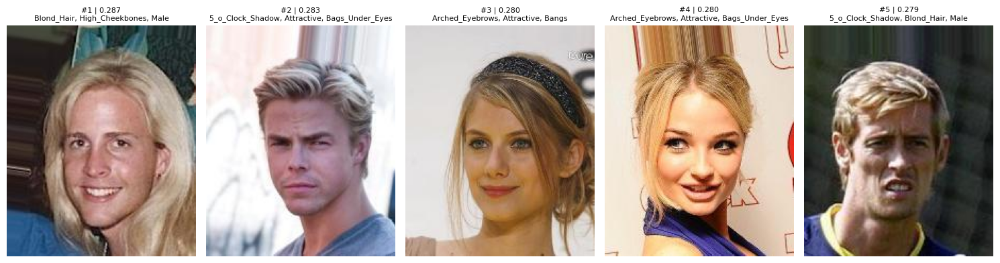


🔍 Query: "a person looking guilty"



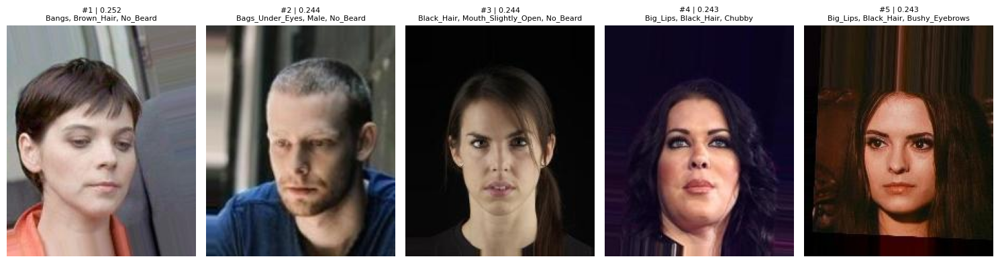

In [76]:
# Test retrieval on CelebA with attribute-based queries
def display_celeba_results(query, results, image_dir, attributes_df=None):
    """Display CelebA retrieval results with attributes."""
    print(f"🔍 Query: \"{query}\"\n")
    
    n = len(results)
    cols = min(5, n)
    rows = (n + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(3*cols, 4*rows))
    if n == 1:
        axes = [axes]
    else:
        axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]
    
    for i, (img_name, score) in enumerate(results):
        img_path = Path(image_dir) / img_name
        if img_path.exists():
            img = Image.open(img_path)
            axes[i].imshow(img)
        
        # Get attributes
        title = f"#{i+1} | {score:.3f}"
        if attributes_df is not None and img_name in attributes_df.index:
            attrs = attributes_df.loc[img_name]
            pos_attrs = [n for n, v in attrs.items() if v == 1][:3]
            title += f"\n{', '.join(pos_attrs)}"
        
        axes[i].set_title(title, fontsize=8)
        axes[i].axis('off')
    
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

# Test queries based on CelebA attributes
celeba_test_queries = [
    "a person wearing glasses",
    "a smiling woman",
    "a man with a beard",
    "a person with blonde hair",
    "a person looking guilty"
]

print("Testing CLIP retrieval on CelebA faces:\n")

if 'celeba_embeddings' in dir():
    for query in celeba_test_queries: # Show first 2
        results = retrieve_images(query, celeba_image_names, celeba_embeddings, top_k=5)
        display_celeba_results(query, results, CELEBA_SUBSET_DIR, celeba_subset_attrs)
        print()
else:
    print("Please compute CelebA embeddings first.")


## Step 8: Baseline Evaluation for CelebA

In [77]:
# Define queries with their ground-truth attribute conditions
# Format: {query: {attribute: expected_value, ...}}

celeba_evaluation_queries = {
    # === Queries with ground-truth attributes ===
    "a person wearing glasses": {
        "Eyeglasses": 1
    },
    "a smiling person": {
        "Smiling": 1
    },
    "a man with a beard": {
        "Male": 1,
        "No_Beard": 0  # No_Beard=0 means HAS beard
    },
    "a young person": {
        "Young": 1
    },    
    # === SUBJECTIVE queries - no ground truth attribute! ===
    # This is exactly what your project is about - concepts CLIP struggles with
    # For these, we'll need MANUAL labeling (empty dict = manual mode)
    "a person looking guilty": {},  # No "Guilty" attribute - subjective!
}

def check_relevance_celeba(image_name, attribute_conditions, attributes_df):
    """
    Check if an image is relevant based on attribute conditions.
    
    Args:
        image_name: Image filename
        attribute_conditions: Dict of {attribute: expected_value}
        attributes_df: DataFrame with attribute labels
    
    Returns:
        1 if all conditions met, 0 otherwise, None if subjective/can't determine
    """
    # Empty conditions = SUBJECTIVE query, needs manual labeling
    if not attribute_conditions:
        return None  # Will trigger manual labeling mode
    
    if attributes_df is None or image_name not in attributes_df.index:
        return None  # Can't determine
    
    attrs = attributes_df.loc[image_name]
    
    for attr, expected in attribute_conditions.items():
        if attr not in attrs:
            return None
        if attrs[attr] != expected:
            return 0  # Condition not met
    
    return 1  # All conditions met

print("✅ CelebA evaluation functions defined!")
print(f"   {len(celeba_evaluation_queries)} queries ready for evaluation")


✅ CelebA evaluation functions defined!
   5 queries ready for evaluation


📊 CELEBA BASELINE EVALUATION
Evaluating Precision@10

Query: "a person wearing glasses" [AUTO]
  Conditions: {'Eyeglasses': 1}
  Precision@10: 100.0% (10/10 relevant)

Query: "a smiling person" [AUTO]
  Conditions: {'Smiling': 1}
  Precision@10: 100.0% (10/10 relevant)

Query: "a man with a beard" [AUTO]
  Conditions: {'Male': 1, 'No_Beard': 0}
  Precision@10: 90.0% (9/10 relevant)

Query: "a young person" [AUTO]
  Conditions: {'Young': 1}
  Precision@10: 100.0% (10/10 relevant)

Query: "a person looking guilty" [MANUAL]
  ⚠️ SUBJECTIVE - No ground truth attribute!
  Manual labels: [1, 1, 0, 0, 1, 0, 0, 0, 0, 0]
  Precision@10: 30.0% (3/10 relevant)

🔍 Query: "a person looking guilty"
   Current labels: [1, 1, 0, 0, 1, 0, 0, 0, 0, 0]


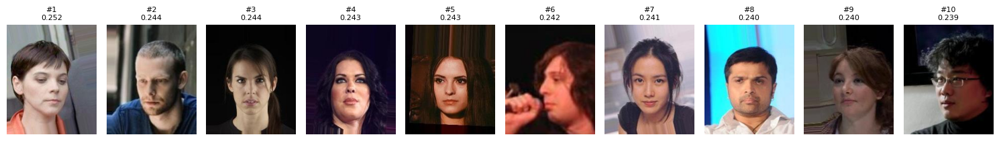


📈 CELEBA AVERAGE PRECISION@10: 84.0%
   (across 5 queries)
   Auto-labeled: 4
   Manual (subjective): 1


In [78]:
# Run baseline evaluation on CelebA
# Uses attributes as ground truth (automatic labeling!)
# SUBJECTIVE queries (empty conditions) need MANUAL labels - update below!

K = 10  # Evaluate Precision@10
celeba_baseline_results = {}

# === MANUAL LABELS FOR SUBJECTIVE QUERIES ===
# Update these after viewing images! (1=relevant, 0=not relevant)
manual_labels = {
    "a person looking guilty": [1, 1, 0, 0, 1, 0, 0, 0, 0, 0],  # UPDATE after viewing!
}

print("📊 CELEBA BASELINE EVALUATION")
print("=" * 70)
print(f"Evaluating Precision@{K}\n")

if 'celeba_embeddings' in dir() and celeba_subset_attrs is not None:
    all_precisions = []
    subjective_queries = []
    
    for query, conditions in celeba_evaluation_queries.items():
        # Retrieve top-k images
        results = retrieve_images(query, celeba_image_names, celeba_embeddings, top_k=K)
        
        # Check if subjective (empty conditions)
        is_subjective = len(conditions) == 0
        
        if is_subjective:
            subjective_queries.append(query)
            # Use manual labels if available
            if query in manual_labels:
                labels = manual_labels[query][:K]
            else:
                labels = [0] * K  # Default to 0, update manually
            label_type = "MANUAL"
        else:
            # Auto-label using attributes
            labels = []
            for img_name, score in results:
                relevance = check_relevance_celeba(img_name, conditions, celeba_subset_attrs)
                labels.append(relevance if relevance is not None else 0)
            label_type = "AUTO"
        
        # Calculate precision
        precision = sum(labels) / len(labels)
        all_precisions.append(precision)
        
        # Store results
        celeba_baseline_results[query] = {
            "conditions": conditions,
            "results": [(img, float(score)) for img, score in results],
            "labels": labels,
            "precision_at_k": precision,
            "k": K,
            "is_subjective": is_subjective
        }
        
        # Display
        print(f"Query: \"{query}\" [{label_type}]")
        if is_subjective:
            print(f"  ⚠️ SUBJECTIVE - No ground truth attribute!")
            print(f"  Manual labels: {labels}")
        else:
            print(f"  Conditions: {conditions}")
        print(f"  Precision@{K}: {precision:.1%} ({sum(labels)}/{K} relevant)")
        print()
    
    # Show images for subjective queries so user can label
    if subjective_queries:
        for query in subjective_queries:
            results = celeba_baseline_results[query]["results"]
            print(f"🔍 Query: \"{query}\"")
            print(f"   Current labels: {celeba_baseline_results[query]['labels']}")
            
            fig, axes = plt.subplots(1, min(K, 10), figsize=(15, 3))
            for i, (img_name, score) in enumerate(results[:10]):
                img_path = CELEBA_SUBSET_DIR / img_name
                if img_path.exists():
                    img = Image.open(img_path)
                    axes[i].imshow(img)
                axes[i].set_title(f"#{i+1}\n{score:.3f}", fontsize=8)
                axes[i].axis('off')
            plt.tight_layout()
            plt.show()
            print()
    
    # Overall metrics
    avg_precision = np.mean(all_precisions)
    print("=" * 70)
    print(f"📈 CELEBA AVERAGE PRECISION@{K}: {avg_precision:.1%}")
    print(f"   (across {len(celeba_evaluation_queries)} queries)")
    print(f"   Auto-labeled: {len(celeba_evaluation_queries) - len(subjective_queries)}")
    print(f"   Manual (subjective): {len(subjective_queries)}")
else:
    print("⏳ Please compute CelebA embeddings and load attributes first.")


🔍 Query: "a person wearing glasses"
   Conditions: {'Eyeglasses': 1}
   Precision@10: 100.0%



/var/folders/l1/9mxd7kds46lfw9cwr03ykbtw0000gn/T/ipykernel_34329/182810095.py:39: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/Users/simretgebreegziabher/miniconda3/envs/proj7/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


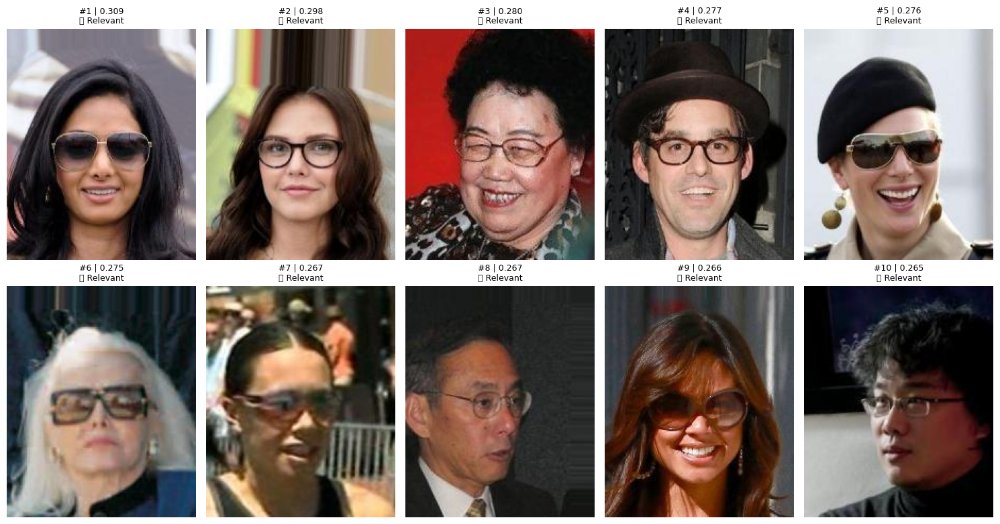

/var/folders/l1/9mxd7kds46lfw9cwr03ykbtw0000gn/T/ipykernel_34329/182810095.py:39: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()



📷 SUBJECTIVE QUERY - Your manual labels shown with green/red borders

🔍 Query: "a person looking guilty"
   Conditions: {}
   Precision@10: 30.0%



/Users/simretgebreegziabher/miniconda3/envs/proj7/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


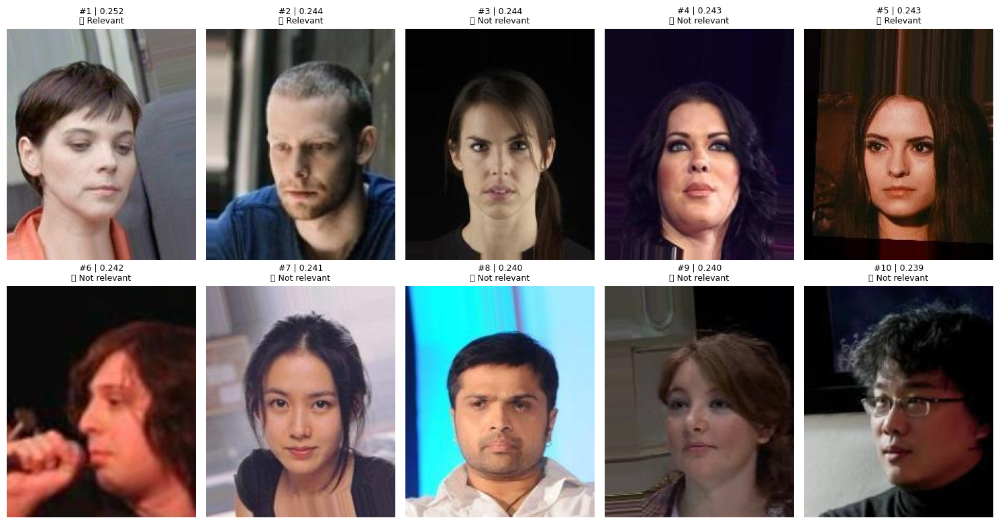

In [79]:
# Visualize one query's results with relevance labels
def visualize_celeba_evaluation(query, results_dict, image_dir, attributes_df):
    """Show retrieval results with auto-labeled relevance."""
    data = results_dict[query]
    results = data["results"]
    labels = data["labels"]
    
    print(f"🔍 Query: \"{query}\"")
    print(f"   Conditions: {data['conditions']}")
    print(f"   Precision@{data['k']}: {data['precision_at_k']:.1%}\n")
    
    n = len(results)
    cols = 5
    rows = (n + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(15, 4*rows))
    axes = axes.flatten()
    
    for i, ((img_name, score), label) in enumerate(zip(results, labels)):
        img_path = Path(image_dir) / img_name
        if img_path.exists():
            img = Image.open(img_path)
            axes[i].imshow(img)
        
        # Color border based on relevance
        color = 'green' if label == 1 else 'red'
        for spine in axes[i].spines.values():
            spine.set_edgecolor(color)
            spine.set_linewidth(4)
        
        # Title
        relevance = "✅ Relevant" if label == 1 else "❌ Not relevant"
        axes[i].set_title(f"#{i+1} | {score:.3f}\n{relevance}", fontsize=9)
        axes[i].axis('off')
    
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
    
    plt.tight_layout()
    plt.show()

# Visualize results for "a person wearing glasses"
if 'celeba_baseline_results' in dir() and celeba_baseline_results:
    visualize_celeba_evaluation(
        "a person wearing glasses", 
        celeba_baseline_results, 
        CELEBA_SUBSET_DIR, 
        celeba_subset_attrs
    )

# Visualize results for "a person looking guilty" (SUBJECTIVE)
if 'celeba_baseline_results' in dir() and celeba_baseline_results:
    print("\n" + "="*70)
    print("📷 SUBJECTIVE QUERY - Your manual labels shown with green/red borders")
    print("="*70 + "\n")
    visualize_celeba_evaluation(
        "a person looking guilty", 
        celeba_baseline_results, 
        CELEBA_SUBSET_DIR, 
        celeba_subset_attrs
    )


In [80]:
# Save CelebA baseline results
CELEBA_RESULTS_FILE = PROJECT_DIR / "celeba_baseline_results.json"

if 'celeba_baseline_results' in dir() and celeba_baseline_results:
    # Prepare serializable format
    celeba_summary = {
        "model": model_name,
        "dataset": "CelebA",
        "num_images": len(celeba_image_names),
        "k": K,
        "average_precision": float(avg_precision),
        "queries": {}
    }
    
    for query, data in celeba_baseline_results.items():
        celeba_summary["queries"][query] = {
            "conditions": {k: int(v) for k, v in data["conditions"].items()},
            "precision_at_k": float(data["precision_at_k"]),
            "labels": data["labels"],
            "num_relevant": sum(data["labels"])
        }
    
    with open(CELEBA_RESULTS_FILE, 'w') as f:
        json.dump(celeba_summary, f, indent=2)
    
    print(f"✅ Saved CelebA baseline results to: {CELEBA_RESULTS_FILE}")
    
    # Summary table
    print("\n📊 CELEBA BASELINE SUMMARY")
    print("=" * 60)
    print(f"{'Query':<35} | Precision@{K}")
    print("-" * 60)
    for query, data in celeba_baseline_results.items():
        print(f"{query:<35} | {data['precision_at_k']:.1%}")
    print("-" * 60)
    print(f"{'AVERAGE':<35} | {avg_precision:.1%}")
else:
    print("⏳ Please run the evaluation cell first.")


✅ Saved CelebA baseline results to: data/celeba_baseline_results.json

📊 CELEBA BASELINE SUMMARY
Query                               | Precision@10
------------------------------------------------------------
a person wearing glasses            | 100.0%
a smiling person                    | 100.0%
a man with a beard                  | 90.0%
a young person                      | 100.0%
a person looking guilty             | 30.0%
------------------------------------------------------------
AVERAGE                             | 84.0%


# Training Autoencoder

In [81]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from pathlib import Path

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

Device: cpu


In [ ]:
EMBEDDINGS_FILE = Path(".") / "image_embeddings.npz"  

data = np.load(EMBEDDINGS_FILE, allow_pickle=True)
image_names = list(data["image_names"])
X = data["embeddings"].astype(np.float32) 

# L2 normalize embeddings
X = X / (np.linalg.norm(X, axis=1, keepdims=True) + 1e-8)

N, D = X.shape
print("Loaded embeddings:", (N, D))
